In [5]:
# Import and set up libraries 
import os
import itertools
import math
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from sklearn.metrics import roc_auc_score, mean_squared_error
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import seaborn as sns

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Constants
CORE_LEN = 9
OUTPUT_SIZE = 1
BLOSUM_FILE = "Data/Matrices/BLOSUM50"
ALPHABET_FILE = "Data/Matrices/alphabet"

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

PyTorch version: 2.5.1
CUDA available: False


In [6]:
# Verify files and check data directory
DATA_DIR = "Data/Alleles"
if os.path.exists(DATA_DIR):
    alleles = os.listdir(DATA_DIR)
    print(f"Found {len(alleles)} alleles: {alleles[:5]}...")
    
    # Check A0101 has files
    a0101_dir = f"{DATA_DIR}/A0101"
    if os.path.exists(a0101_dir):
        files = os.listdir(a0101_dir)
        c_files = [f for f in files if f.startswith('c')]
        f_files = [f for f in files if f.startswith('f')]
        print(f"A0101 has {len(files)} files")
        print(f"  c files: {sorted(c_files)}")
        print(f"  f files: {sorted(f_files)}")
    else:
        print("ERROR: A0101 directory not found!")
else:
    print("ERROR: Data directory not found!")

# Check BLOSUM and alphabet files
print("\nChecking resource files...")
if os.path.exists(BLOSUM_FILE):
    print(f"BLOSUM file: {BLOSUM_FILE}")
else:
    print(f"BLOSUM file not found: {BLOSUM_FILE}")

if os.path.exists(ALPHABET_FILE):
    print(f"Alphabet file: {ALPHABET_FILE}")
    with open(ALPHABET_FILE, 'r') as f:
        content = f.read().strip()
        print(f"Content: {content}")
else:
    print(f"Alphabet file not found: {ALPHABET_FILE}")

Found 36 alleles: ['A6802', 'B5801', 'B5701', 'A3101', 'B0702']...
A0101 has 11 files
  c files: ['c000', 'c001', 'c002', 'c003', 'c004']
  f files: ['f000', 'f001', 'f002', 'f003', 'f004']

Checking resource files...
BLOSUM file: Data/Matrices/BLOSUM50
Alphabet file: Data/Matrices/alphabet
Content: A
R
N
D
C
Q
E
G
H
I
L
K
M
F
P
S
T
W
Y
V


In [7]:
# BLOSUM and alphabet loading
import pandas as pd
import numpy as np
import torch

def load_blosum(blosum_file, alphabet_file):
    """
    Load BLOSUM50 substitution matrix using separate alphabet file.
    Handles various file formats robustly.
    """
    # Load alphabet
    with open(alphabet_file, 'r') as f:
        content = f.read().strip()
        aa = content.split()
    
    # Remove any empty strings or comment lines
    aa = [a for a in aa if a and not a.startswith('#')]
    
    print(f" Loaded {len(aa)} amino acids from alphabet: {aa[:5]}...")
    
    # Load BLOSUM matrix - try multiple parsing strategies
    blosum_numpy = None
    
    # Strategy 1: Read as numbers only (no headers)
    try:
        # Read all lines, skip comments
        lines = []
        with open(blosum_file, 'r') as f:
            for line in f:
                line = line.strip()
                if line and not line.startswith('#'):
                    # Split by whitespace and convert to float
                    parts = line.split()
                    # Skip lines that don't look like numbers
                    try:
                        nums = [float(x) for x in parts]
                        if len(nums) >= len(aa):
                            lines.append(nums[:len(aa)])
                    except ValueError:
                        continue
        
        if lines:
            blosum_numpy = np.array(lines, dtype=np.float32)
            print(f"  Strategy 1: Loaded matrix shape {blosum_numpy.shape}")
    except Exception as e:
        print(f"  Strategy 1 failed: {e}")
    
    # Strategy 2: Try pandas with header=None (if strategy 1 failed)
    if blosum_numpy is None or blosum_numpy.shape[0] < len(aa):
        try:
            df = pd.read_csv(blosum_file, sep=r"\s+", comment="#", header=None)
            blosum_numpy = df.to_numpy(dtype=np.float32)
            print(f"  Strategy 2: Loaded matrix shape {blosum_numpy.shape}")
        except Exception as e:
            print(f"  Strategy 2 failed: {e}")
    
    # Strategy 3: Try pandas with header=0 (if first row has column names)
    if blosum_numpy is None:
        try:
            df = pd.read_csv(blosum_file, sep=r"\s+", comment="#", header=0)
            blosum_numpy = df.to_numpy(dtype=np.float32)
            print(f"  Strategy 3: Loaded matrix shape {blosum_numpy.shape}")
        except Exception as e:
            print(f"  Strategy 3 failed: {e}")
    
    # Check if we have a valid matrix
    if blosum_numpy is None:
        raise ValueError(f"Could not parse BLOSUM file: {blosum_file}")
    
    # Make sure the matrix matches the alphabet size
    n_aa = len(aa)
    
    # If matrix has fewer rows than amino acids, pad with zeros
    if blosum_numpy.shape[0] < n_aa:
        print(f"  Matrix has {blosum_numpy.shape[0]} rows, alphabet has {n_aa}")
        new_matrix = np.full((n_aa, n_aa), -1.0, dtype=np.float32)
        new_matrix[:blosum_numpy.shape[0], :blosum_numpy.shape[1]] = blosum_numpy[:, :n_aa]
        blosum_numpy = new_matrix
        print(f"  Padded matrix to shape {blosum_numpy.shape}")
    
    # If matrix has fewer columns than amino acids, pad with zeros
    if blosum_numpy.shape[1] < n_aa:
        print(f"  Matrix has {blosum_numpy.shape[1]} columns, alphabet has {n_aa}")
        new_matrix = np.full((n_aa, n_aa), -1.0, dtype=np.float32)
        new_matrix[:blosum_numpy.shape[0], :blosum_numpy.shape[1]] = blosum_numpy[:n_aa, :]
        blosum_numpy = new_matrix
        print(f"  Padded matrix to shape {blosum_numpy.shape}")
    
    # If matrix has more rows/cols than amino acids, truncate
    if blosum_numpy.shape[0] > n_aa:
        blosum_numpy = blosum_numpy[:n_aa, :]
        print(f"  Truncated matrix to shape {blosum_numpy.shape}")
    
    if blosum_numpy.shape[1] > n_aa:
        blosum_numpy = blosum_numpy[:, :n_aa]
        print(f"  Truncated matrix to shape {blosum_numpy.shape}")
    
    # Final check
    if blosum_numpy.shape != (n_aa, n_aa):
        print(f"  Warning: Final matrix shape {blosum_numpy.shape} vs expected ({n_aa}, {n_aa})")
        # Force reshape
        if blosum_numpy.size >= n_aa * n_aa:
            blosum_numpy = blosum_numpy[:n_aa, :n_aa]
        else:
            new_matrix = np.full((n_aa, n_aa), -1.0, dtype=np.float32)
            rows = min(blosum_numpy.shape[0], n_aa)
            cols = min(blosum_numpy.shape[1], n_aa)
            new_matrix[:rows, :cols] = blosum_numpy[:rows, :cols]
            blosum_numpy = new_matrix
    
    blosum_matrix = torch.tensor(blosum_numpy, dtype=torch.float32)
    aa_to_idx = {aa: i for i, aa in enumerate(aa)}
    
    print(f"  Final matrix shape: {blosum_matrix.shape}")
    return blosum_matrix, aa_to_idx

def load_peptide_target(filename):
    """Load peptide and target values from a data file."""
    try:
        df = pd.read_csv(filename, sep=r"\s+", usecols=[0, 1], names=["peptide", "target"])
        return df.sort_values(by="target", ascending=False).reset_index(drop=True)
    except Exception as e:
        print(f"  Error loading {filename}: {e}")
        raise

def encode_peptides(x_in, blosum_file, alphabet_file, core_len=9):
    """Encode peptides using BLOSUM matrix."""
    blosum50, aa_to_idx = load_blosum(blosum_file, alphabet_file)

    x_idx = []
    pep_idx = []

    for i, peptide in enumerate(x_in["peptide"]):
        for j in range(len(peptide) - core_len + 1):
            core = peptide[j:j + core_len]
            # Use 'X' as fallback for unknown amino acids
            x_idx.append([aa_to_idx.get(aa, aa_to_idx.get('X', 0)) for aa in core])
            pep_idx.append(i)

    x_idx = torch.tensor(x_idx, dtype=torch.long)
    x_out = blosum50[x_idx]
    y_out = torch.tensor(x_in["target"].to_numpy(), dtype=torch.float32).reshape(-1, 1)
    pep_idx = torch.tensor(pep_idx, dtype=torch.long).reshape(-1, 1)

    return x_out, y_out, pep_idx

In [8]:
# Debug: Check BLOSUM file
import pandas as pd

BLOSUM_FILE = "Data/Matrices/BLOSUM50"
ALPHABET_FILE = "Data/Matrices/alphabet"

print("ALPHABET FILE")
with open(ALPHABET_FILE, 'r') as f:
    content = f.read().strip()
    print(f"Content: '{content}'")
    aa = content.split()
    print(f"Parsed: {aa}")
    print(f"Count: {len(aa)}")

print("\n BLOSUM FILE ")
with open(BLOSUM_FILE, 'r') as f:
    lines = f.readlines()
    print(f"Total lines: {len(lines)}")
    print("First 10 lines:")
    for i, line in enumerate(lines[:10]):
        print(f"  {i}: {repr(line.strip())[:80]}")

print("\n Try parsing with different strategies ")

# Strategy: Read as DataFrame with header=None
try:
    df = pd.read_csv(BLOSUM_FILE, sep=r"\s+", comment="#", header=None)
    print(f"header=None: shape {df.shape}")
    print(f"First 5 rows:\n{df.head()}")
except Exception as e:
    print(f"header=None failed: {e}")

# Strategy: Read as DataFrame with header=0
try:
    df2 = pd.read_csv(BLOSUM_FILE, sep=r"\s+", comment="#", header=0)
    print(f"header=0: shape {df2.shape}")
    print(f"First 5 rows:\n{df2.head()}")
except Exception as e:
    print(f"header=0 failed: {e}")

# Strategy: Read as numbers only
try:
    nums = []
    with open(BLOSUM_FILE, 'r') as f:
        for line in f:
            line = line.strip()
            if line and not line.startswith('#'):
                parts = line.split()
                try:
                    row = [float(x) for x in parts]
                    nums.append(row)
                except:
                    pass
    print(f"Numbers only: {len(nums)} rows")
    if nums:
        print(f"First row: {nums[0][:10]}...")
except Exception as e:
    print(f"Numbers only failed: {e}")

ALPHABET FILE
Content: 'A
R
N
D
C
Q
E
G
H
I
L
K
M
F
P
S
T
W
Y
V'
Parsed: ['A', 'R', 'N', 'D', 'C', 'Q', 'E', 'G', 'H', 'I', 'L', 'K', 'M', 'F', 'P', 'S', 'T', 'W', 'Y', 'V']
Count: 20

 BLOSUM FILE 
Total lines: 24
First 10 lines:
  0: '5 -2 -1 -2 -1 -1 -1 0 -2 -1 -2 -1 -1 -3 -1 1 0 -3 -2 0'
  1: '-2 7 -1 -2 -4 1 0 -3 0 -4 -3 3 -2 -3 -3 -1 -1 -3 -1 -3'
  2: '-1 -1 7 2 -2 0 0 0 1 -3 -4 0 -2 -4 -2 1 0 -4 -2 -3'
  3: '-2 -2 2 8 -4 0 2 -1 -1 -4 -4 -1 -4 -5 -1 0 -1 -5 -3 -4'
  4: '-1 -4 -2 -4 13 -3 -3 -3 -3 -2 -2 -3 -2 -2 -4 -1 -1 -5 -3 -1'
  5: '-1 1 0 0 -3 7 2 -2 1 -3 -2 2 0 -4 -1 0 -1 -1 -1 -3'
  6: '-1 0 0 2 -3 2 6 -3 0 -4 -3 1 -2 -3 -1 -1 -1 -3 -2 -3'
  7: '0 -3 0 -1 -3 -2 -3 8 -2 -4 -4 -2 -3 -4 -2 0 -2 -3 -3 -4'
  8: '-2 0 1 -1 -3 1 0 -2 10 -4 -3 0 -1 -1 -2 -1 -2 -3 2 -4'
  9: '-1 -4 -3 -4 -2 -3 -4 -4 -4 5 2 -3 2 0 -3 -3 -1 -3 -1 4'

 Try parsing with different strategies 
header=None: shape (24, 20)
First 5 rows:
   0   1   2   3   4   5   6   7   8   9   10  11  12  13  14  15  16  

In [9]:
# Neural network model
def xavier_initialization_normal(layer_weights):
    return nn.init.xavier_normal_(layer_weights)

class SimpleFFNN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, 
                 initialization_function=xavier_initialization_normal):
        super().__init__()
        self.in_layer = nn.Linear(input_size, hidden_size)
        self.out_layer = nn.Linear(hidden_size, output_size)
        self.hidden_act = nn.ReLU()
        self.out_act = nn.Sigmoid()

        initialization_function(self.in_layer.weight)
        initialization_function(self.out_layer.weight)

    def forward(self, x, pep_idx):
        z1 = self.in_layer(x)
        a1 = self.hidden_act(z1)
        z2 = self.out_layer(a1)
        a2 = self.out_act(z2)

        # NNAlign: take max score across all 9-mer cores
        n_peptides = int(pep_idx.max().item()) + 1

        a2_best = torch.full(
            size=(n_peptides, a2.shape[1]),
            fill_value=-float("inf"),
            dtype=a2.dtype,
            device=a2.device
        )

        a2_best.scatter_reduce_(
            dim=0,
            index=pep_idx.expand(-1, a2.shape[1]),
            src=a2,
            reduce="amax",
            include_self=True
        )

        return a2_best

In [10]:
# Training and evaluation functions 
def train_network(net, x_train, y_train, pep_idx_train, optimizer):
    net.train()
    loss_fn = nn.MSELoss()
    preds = net(x_train, pep_idx_train)
    loss = loss_fn(preds, y_train)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    return loss.item()

def eval_network(net, x_valid, y_valid, pep_idx_valid):
    net.eval()
    loss_fn = nn.MSELoss()
    with torch.no_grad():
        preds = net(x_valid, pep_idx_valid)
        loss = loss_fn(preds, y_valid)
    return loss.item()

def train_model(train_file, valid_file, hidden_size, learning_rate, 
                weight_decay, patience, seed, blosum_file, alphabet_file,
                epochs=2000, verbose=False):
    """
    Train a model with early stopping.
    """
    torch.manual_seed(seed)
    
    # Load data
    train_raw = load_peptide_target(train_file)
    valid_raw = load_peptide_target(valid_file)
    
    if verbose:
        print(f"  Training data: {len(train_raw)} peptides")
        print(f"  Validation data: {len(valid_raw)} peptides")
    
    # Encode
    x_train, y_train, pep_idx_train = encode_peptides(train_raw, blosum_file, alphabet_file, CORE_LEN)
    x_valid, y_valid, pep_idx_valid = encode_peptides(valid_raw, blosum_file, alphabet_file, CORE_LEN)
    
    x_train = x_train.reshape(x_train.shape[0], -1)
    x_valid = x_valid.reshape(x_valid.shape[0], -1)
    
    # Build model
    input_size = x_train.shape[1]
    model = SimpleFFNN(input_size=input_size, hidden_size=hidden_size, output_size=OUTPUT_SIZE)
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    
    # Training loop with early stopping
    best_valid_loss = float('inf')
    best_model_state = None
    best_epoch = 0
    patience_counter = 0
    train_losses = []
    valid_losses = []
    
    for epoch in range(epochs):
        train_loss = train_network(model, x_train, y_train, pep_idx_train, optimizer)
        valid_loss = eval_network(model, x_valid, y_valid, pep_idx_valid)
        
        train_losses.append(train_loss)
        valid_losses.append(valid_loss)
        
        if valid_loss < best_valid_loss:
            best_valid_loss = valid_loss
            best_model_state = model.state_dict().copy()
            best_epoch = epoch
            patience_counter = 0
        else:
            patience_counter += 1
        
        if patience_counter >= patience:
            if verbose:
                print(f"  Early stopping at epoch {epoch} (best: {best_epoch})")
            break
        
        if verbose and (epoch % max(1, epochs // 20) == 0 or epoch == epochs - 1):
            print(f"  Epoch {epoch}: train_loss={train_loss:.6f}, valid_loss={valid_loss:.6f}")
    
    # Load best model
    model.load_state_dict(best_model_state)
    
    return model, best_epoch, best_valid_loss, train_losses, valid_losses

In [11]:
# Predictions 
def predict(model, test_file, blosum_file, alphabet_file):
    """Make predictions on test data."""
    test_raw = load_peptide_target(test_file)
    x_test, y_test, pep_idx_test = encode_peptides(test_raw, blosum_file, alphabet_file, CORE_LEN)
    x_test = x_test.reshape(x_test.shape[0], -1)
    
    model.eval()
    with torch.no_grad():
        preds = model(x_test, pep_idx_test).squeeze(1).cpu().numpy()
    
    result_df = test_raw.copy()
    result_df["prediction"] = preds
    return result_df

def compute_metrics(df, affinity_threshold=0.5):
    """
    Compute AUC, PCC, and MSE.
    
    Args:
        df: DataFrame with 'target' and 'prediction' columns
        affinity_threshold: Threshold to convert continuous targets to binary
                           (higher than threshold = binder)
    """
    y_true = df['target'].values
    y_pred = df['prediction'].values
    y_true_binary = (y_true >= affinity_threshold).astype(int)
    
    # Compute AUC using binary labels
    try:
        auc = roc_auc_score(y_true_binary, y_pred)
    except Exception as e:
        print(f"  AUC computation error: {e}")
        auc = float('nan')
    
    # PCC on continuous values (original targets)
    try:
        pcc, pcc_pvalue = pearsonr(y_true, y_pred)
    except Exception as e:
        print(f"  PCC computation error: {e}")
        pcc = float('nan')
        pcc_pvalue = float('nan')
    
    # MSE on continuous values
    mse = mean_squared_error(y_true, y_pred)
    
    return {
        'auc': auc,
        'pcc': pcc,
        'pcc_pvalue': pcc_pvalue,
        'mse': mse,
        'n_samples': len(y_true),
        'n_binders': y_true_binary.sum(),
        'n_nonbinders': len(y_true_binary) - y_true_binary.sum()
    }

In [12]:
# Nested CV Function
def run_nested_cv(allele_dir, outer_fold, hyperparameter_grid, 
                  patience=20, seed=42, epochs=2000, 
                  blosum_file="Data/Matrices/BLOSUM50",
                  alphabet_file="Data/Matrices/alphabet",
                  verbose=False):
    """
    Run nested CV for a single outer fold.
    """
    # Set random seed
    torch.manual_seed(seed)
    np.random.seed(seed)
    
    # --- OUTER LOOP ---
    test_file = f"{allele_dir}/f{outer_fold:03d}"
    train_fold_files = [f"{allele_dir}/c{i:03d}" for i in range(5) if i != outer_fold]
    
    if verbose:
        print(f"\n=== Outer fold {outer_fold} ===")
        print(f"Training on: {[os.path.basename(f) for f in train_fold_files]}")
        print(f"Testing on: {os.path.basename(test_file)}")
    
    # --- INNER LOOP: Hyperparameter Search ---
    combos = list(itertools.product(
        hyperparameter_grid['hidden_size'],
        hyperparameter_grid['learning_rate'],
        hyperparameter_grid['weight_decay']
    ))
    
    best_params = None
    best_avg_score = float('inf')
    inner_results = []
    
    # Check if we can even load the data
    try:
        test_raw = load_peptide_target(test_file)
        print(f"  Test file loaded: {len(test_raw)} peptides")
    except Exception as e:
        print(f"  ERROR: Cannot load test file {test_file}: {e}")
        return {
            'outer_fold': outer_fold,
            'best_hidden_size': None,
            'best_learning_rate': None,
            'best_weight_decay': None,
            'best_inner_avg_mse': float('inf'),
            'test_auc': float('nan'),
            'test_pcc': float('nan'),
            'test_mse': float('nan'),
            'test_predictions': None,
            'inner_results': []
        }
    
    for hidden_size, learning_rate, weight_decay in combos:
        inner_scores = []
        
        for inner_val_idx, inner_val_file in enumerate(train_fold_files):
            inner_train_files = [f for i, f in enumerate(train_fold_files) 
                                 if i != inner_val_idx]
            inner_train_file = inner_train_files[0]  # Simplified
            
            try:
                # Check if files exist
                if not os.path.exists(inner_train_file):
                    print(f"  WARNING: Train file not found: {inner_train_file}")
                    inner_scores.append(float('inf'))
                    continue
                if not os.path.exists(inner_val_file):
                    print(f"  WARNING: Valid file not found: {inner_val_file}")
                    inner_scores.append(float('inf'))
                    continue
                
                model, best_epoch, best_loss, train_losses, valid_losses = train_model(
                    train_file=inner_train_file,
                    valid_file=inner_val_file,
                    hidden_size=hidden_size,
                    learning_rate=learning_rate,
                    weight_decay=weight_decay,
                    patience=patience,
                    seed=seed + len(inner_results),
                    blosum_file=blosum_file,
                    alphabet_file=alphabet_file,
                    epochs=epochs,
                    verbose=False
                )
                
                val_predictions = predict(model, inner_val_file, blosum_file, alphabet_file)
                metrics = compute_metrics(val_predictions, affinity_threshold=0.5)
                inner_scores.append(metrics['mse'])
                
            except Exception as e:
                print(f"  ERROR for h={hidden_size}, lr={learning_rate}, wd={weight_decay}: {str(e)[:100]}")
                inner_scores.append(float('inf'))
        
        avg_score = np.mean(inner_scores) if inner_scores else float('inf')
        
        inner_results.append({
            'hidden_size': hidden_size,
            'learning_rate': learning_rate,
            'weight_decay': weight_decay,
            'avg_mse': avg_score
        })
        
        if verbose:
            print(f"  h={hidden_size}, lr={learning_rate}, wd={weight_decay}: avg_MSE={avg_score:.6f}")
        
        if avg_score < best_avg_score:
            best_avg_score = avg_score
            best_params = (hidden_size, learning_rate, weight_decay)
    
    # If all failed, use default parameters
    if best_params is None:
        print(f"  WARNING: All hyperparameter combinations failed! Using defaults.")
        best_params = (25, 0.01, 0.0001)
        best_avg_score = float('inf')
    
    if verbose:
        print(f"Best params: h={best_params[0]}, lr={best_params[1]}, wd={best_params[2]}")
    
    # --- OUTER LOOP: Train with best params and test ---
    final_train_file = train_fold_files[0]
    hidden_size, learning_rate, weight_decay = best_params
    
    try:
        final_model, _, _, _, _ = train_model(
            train_file=final_train_file,
            valid_file=train_fold_files[1] if len(train_fold_files) > 1 else train_fold_files[0],
            hidden_size=hidden_size,
            learning_rate=learning_rate,
            weight_decay=weight_decay,
            patience=patience,
            seed=seed + 100,
            blosum_file=blosum_file,
            alphabet_file=alphabet_file,
            epochs=epochs,
            verbose=False
        )
        
        test_predictions = predict(final_model, test_file, blosum_file, alphabet_file)
        test_metrics = compute_metrics(test_predictions)
        
    except Exception as e:
        print(f"  ERROR in final training: {e}")
        test_metrics = {'auc': float('nan'), 'pcc': float('nan'), 'mse': float('nan'), 'n_samples': 0}
        test_predictions = None
    
    return {
        'outer_fold': outer_fold,
        'best_hidden_size': best_params[0],
        'best_learning_rate': best_params[1],
        'best_weight_decay': best_params[2],
        'best_inner_avg_mse': best_avg_score,
        'test_auc': test_metrics.get('auc', float('nan')),
        'test_pcc': test_metrics.get('pcc', float('nan')),
        'test_mse': test_metrics.get('mse', float('nan')),
        'test_predictions': test_predictions,
        'inner_results': inner_results
    }

In [13]:
# Run nested CV 
hyperparameter_grid = {
    'hidden_size': [10, 25, 50, 100],
    'learning_rate': [0.1, 0.01, 0.001],
    'weight_decay': [0.0, 0.0001, 0.001]
}

# Select allele to analyze
ALLELE = "A0101"
ALLELE_DIR = f"Data/Alleles/{ALLELE}"

# Verify the allele directory exists
if not os.path.exists(ALLELE_DIR):
    print(f"ERROR: Directory {ALLELE_DIR} not found!")
    print("Available alleles:", os.listdir("Data/Alleles") if os.path.exists("Data/Alleles") else "None")
else:
    print(f"Running nested CV for {ALLELE}")
    print(f"Hyperparameter grid:")
    print(f"  hidden_size: {hyperparameter_grid['hidden_size']}")
    print(f"  learning_rate: {hyperparameter_grid['learning_rate']}")
    print(f"  weight_decay: {hyperparameter_grid['weight_decay']}")
    print(f"Total combinations: {len(hyperparameter_grid['hidden_size']) * len(hyperparameter_grid['learning_rate']) * len(hyperparameter_grid['weight_decay'])}")

# Run nested CV for all 5 outer folds
all_results = []

for outer_fold in range(5):
    result = run_nested_cv(
        allele_dir=ALLELE_DIR,
        outer_fold=outer_fold,
        hyperparameter_grid=hyperparameter_grid,
        patience=20,
        seed=42 + outer_fold,
        epochs=2000,
        blosum_file=BLOSUM_FILE,
        alphabet_file=ALPHABET_FILE,
        verbose=True
    )
    all_results.append(result)

Running nested CV for A0101
Hyperparameter grid:
  hidden_size: [10, 25, 50, 100]
  learning_rate: [0.1, 0.01, 0.001]
  weight_decay: [0.0, 0.0001, 0.001]
Total combinations: 36

=== Outer fold 0 ===
Training on: ['c001', 'c002', 'c003', 'c004']
Testing on: f000
  Test file loaded: 925 peptides
 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded matrix shape (24, 20)
  Truncated matrix to shape (20, 20)
  Final matrix shape: torch.Size([20, 20])
 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded matrix shape (24, 20)
  Truncated matrix to shape (20, 20)
  Final matrix shape: torch.Size([20, 20])


 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded matrix shape (24, 20)
  Truncated matrix to shape (20, 20)
  Final matrix shape: torch.Size([20, 20])
 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded matrix shape (24, 20)
  Truncated matrix to shape (20, 20)
  Final matrix shape: torch.Size([20, 20])
 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded matrix shape (24, 20)
  Truncated matrix to shape (20, 20)
  Final matrix shape: torch.Size([20, 20])
 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded matrix shape (24, 20)
  Truncated matrix to shape (20, 20)
  Final matrix shape: torch.Size([20, 20])
 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded matrix shape (24, 20)
  Truncated matrix to shape (20, 20)
  Final matrix shape: torch.Size([20, 20])
 Loaded 20 amino acids from alphabet: ['A', 'R', '

In [14]:
# Results 
valid_results = [r for r in all_results if r['test_auc'] is not None and not np.isnan(r['test_auc'])]

if len(valid_results) == 0:
    print("ERROR: No valid results were obtained!")
else:
    # Convert to DataFrame
    summary_df = pd.DataFrame([{
        'outer_fold': r['outer_fold'],
        'best_hidden': r['best_hidden_size'],
        'best_lr': r['best_learning_rate'],
        'best_wd': r['best_weight_decay'],
        'best_inner_mse': r['best_inner_avg_mse'],
        'test_auc': r['test_auc'],
        'test_pcc': r['test_pcc'],
        'test_mse': r['test_mse']
    } for r in valid_results])

    print("SUMMARY OF NESTED CV RESULTS")
    display(summary_df)

    print(f"\nAverage test AUC: {summary_df['test_auc'].mean():.4f} (+/- {summary_df['test_auc'].std():.4f})")
    print(f"Average test PCC: {summary_df['test_pcc'].mean():.4f} (+/- {summary_df['test_pcc'].std():.4f})")

    # Create output directory
    output_dir = "results/nested_cv"
    os.makedirs(output_dir, exist_ok=True)

    # Save summary
    summary_df.to_csv(os.path.join(output_dir, f"{ALLELE}_summary.csv"), index=False)

    # Save individual fold predictions and inner results
    for i, r in enumerate(valid_results):
        fold_dir = os.path.join(output_dir, f"{ALLELE}_fold_{r['outer_fold']}")
        os.makedirs(fold_dir, exist_ok=True)
        if r['test_predictions'] is not None:
            r['test_predictions'].to_csv(os.path.join(fold_dir, "predictions.csv"), index=False)
        
        if r.get('inner_results'):
            inner_df = pd.DataFrame(r['inner_results'])
            inner_df.to_csv(os.path.join(fold_dir, "inner_results.csv"), index=False)

    print(f"\nResults saved to {output_dir}")

SUMMARY OF NESTED CV RESULTS


,outer_fold,best_hidden,best_lr,best_wd,best_inner_mse,test_auc,test_pcc,test_mse
0,0,10,0.1,0.0010,0.028468,0.912909,0.584394,0.022430
1,1,100,0.1,0.0010,0.024025,0.600983,0.083685,0.047589
2,2,10,0.1,0.0010,0.025824,0.901886,0.511752,0.024753
3,3,10,0.1,0.0010,0.023902,0.703060,0.186768,0.042013
4,4,10,0.1,0.0001,0.026985,0.807640,0.266521,0.047148



Average test AUC: 0.7853 (+/- 0.1333)
Average test PCC: 0.3266 (+/- 0.2138)

Results saved to results/nested_cv


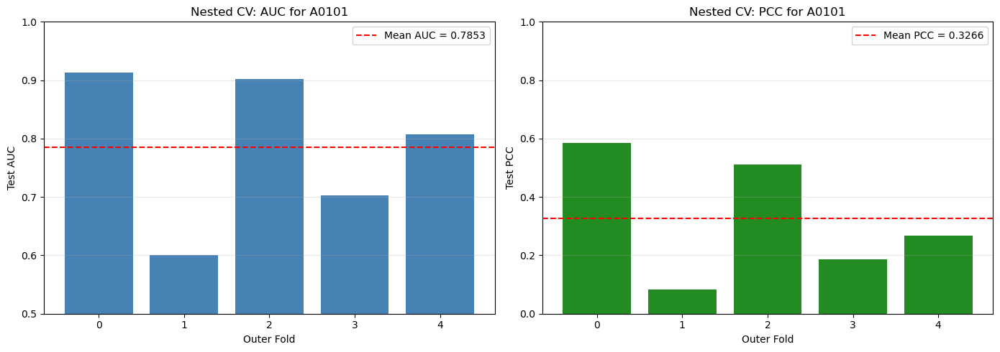

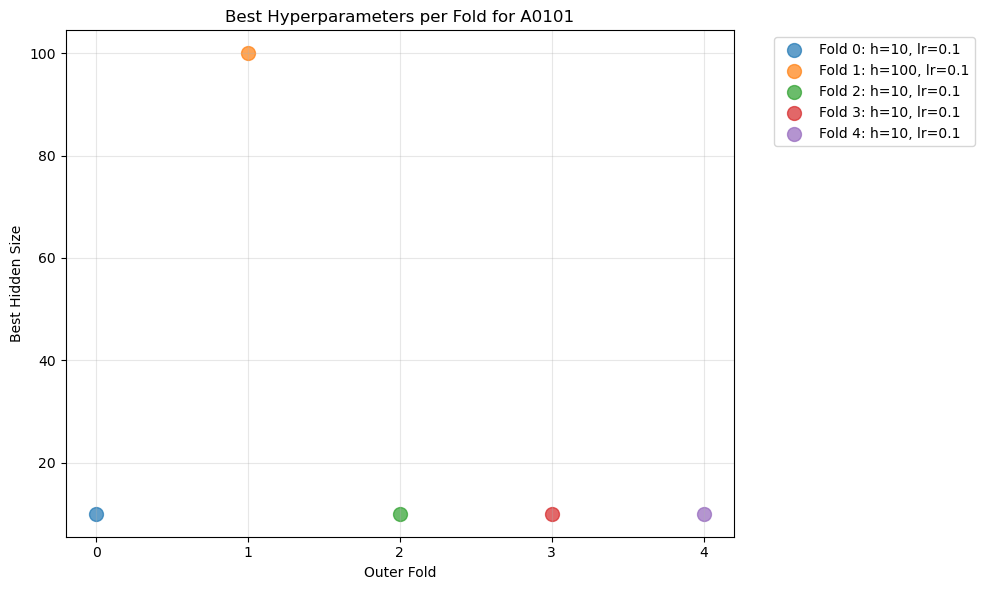

Best hidden sizes per fold: [10, 100, 10, 10, 10]
Best learning rates per fold: [0.1, 0.1, 0.1, 0.1, 0.1]
Best weight decays per fold: [0.001, 0.001, 0.001, 0.001, 0.0001]


In [15]:
# Visualise results 
# Plot AUC across folds
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# AUC plot
ax1 = axes[0]
bars1 = ax1.bar(summary_df['outer_fold'], summary_df['test_auc'], color='steelblue')
ax1.axhline(y=summary_df['test_auc'].mean(), color='red', linestyle='--', 
            label=f"Mean AUC = {summary_df['test_auc'].mean():.4f}")
ax1.set_xlabel('Outer Fold')
ax1.set_ylabel('Test AUC')
ax1.set_title(f'Nested CV: AUC for {ALLELE}')
ax1.set_ylim(0.5, 1.0)
ax1.legend()
ax1.grid(axis='y', alpha=0.3)

# PCC plot
ax2 = axes[1]
bars2 = ax2.bar(summary_df['outer_fold'], summary_df['test_pcc'], color='forestgreen')
ax2.axhline(y=summary_df['test_pcc'].mean(), color='red', linestyle='--', 
            label=f"Mean PCC = {summary_df['test_pcc'].mean():.4f}")
ax2.set_xlabel('Outer Fold')
ax2.set_ylabel('Test PCC')
ax2.set_title(f'Nested CV: PCC for {ALLELE}')
ax2.set_ylim(0, 1.0)
ax2.legend()
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(output_dir, f"{ALLELE}_results.png"), dpi=150)
plt.show()

# Plot best hyperparameters
fig, ax = plt.subplots(figsize=(10, 6))
for i, r in enumerate(all_results):
    ax.scatter(i, r['best_hidden_size'], s=100, 
               label=f"Fold {i}: h={r['best_hidden_size']}, lr={r['best_learning_rate']}", 
               alpha=0.7)
ax.set_xlabel('Outer Fold')
ax.set_ylabel('Best Hidden Size')
ax.set_title(f'Best Hyperparameters per Fold for {ALLELE}')
ax.set_xticks(range(5))
ax.grid(alpha=0.3)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig(os.path.join(output_dir, f"{ALLELE}_hyperparams.png"), dpi=150)
plt.show()

print(f"Best hidden sizes per fold: {summary_df['best_hidden'].tolist()}")
print(f"Best learning rates per fold: {summary_df['best_lr'].tolist()}")
print(f"Best weight decays per fold: {summary_df['best_wd'].tolist()}")

In [16]:
# Test with just one fold
print("Testing with outer_fold=0 only...")

test_result = run_nested_cv(
    allele_dir=ALLELE_DIR,
    outer_fold=0,
    hyperparameter_grid={
        'hidden_size': [10, 25],  # Smaller grid for testing
        'learning_rate': [0.01, 0.001],
        'weight_decay': [0.0, 0.0001]
    },
    patience=20,
    seed=42,
    epochs=200,  # Fewer epochs for testing
    blosum_file=BLOSUM_FILE,
    alphabet_file=ALPHABET_FILE,
    verbose=True
)

print(f"\nTest result for outer_fold=0:")
print(f"  Best hidden: {test_result['best_hidden_size']}")
print(f"  Best LR: {test_result['best_learning_rate']}")
print(f"  Best WD: {test_result['best_weight_decay']}")
print(f"  Test AUC: {test_result['test_auc']:.4f}")
print(f"  Test PCC: {test_result['test_pcc']:.4f}")

Testing with outer_fold=0 only...

=== Outer fold 0 ===
Training on: ['c001', 'c002', 'c003', 'c004']
Testing on: f000
  Test file loaded: 925 peptides
 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded matrix shape (24, 20)
  Truncated matrix to shape (20, 20)
  Final matrix shape: torch.Size([20, 20])
 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded matrix shape (24, 20)
  Truncated matrix to shape (20, 20)
  Final matrix shape: torch.Size([20, 20])
 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded matrix shape (24, 20)
  Truncated matrix to shape (20, 20)
  Final matrix shape: torch.Size([20, 20])
 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded matrix shape (24, 20)
  Truncated matrix to shape (20, 20)
  Final matrix shape: torch.Size([20, 20])
 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded 

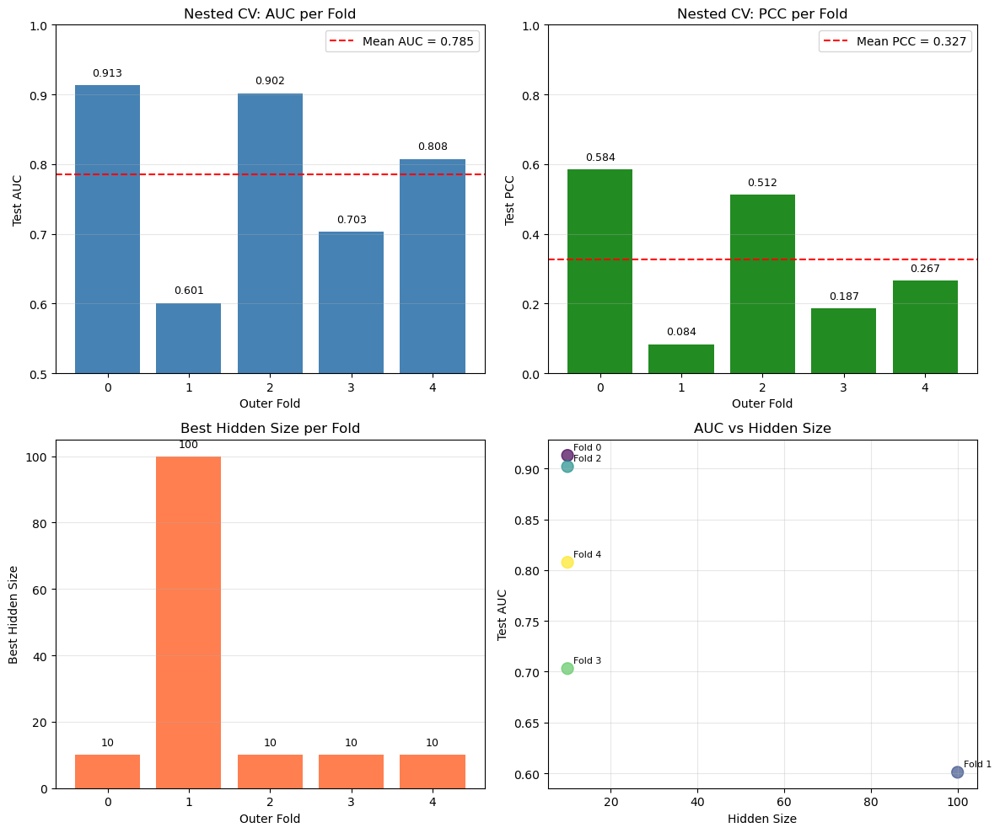

In [17]:
# Plot Summary Results

import matplotlib.pyplot as plt
import numpy as np

# Summary data
outer_folds = summary_df['outer_fold'].values
aucs = summary_df['test_auc'].values
pccs = summary_df['test_pcc'].values
hidden_sizes = summary_df['best_hidden'].values

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Plot 1: AUC per fold
ax1 = axes[0, 0]
bars1 = ax1.bar(outer_folds, aucs, color='steelblue')
ax1.axhline(y=np.mean(aucs), color='red', linestyle='--', 
            label=f"Mean AUC = {np.mean(aucs):.3f}")
ax1.set_xlabel('Outer Fold')
ax1.set_ylabel('Test AUC')
ax1.set_title('Nested CV: AUC per Fold')
ax1.set_ylim(0.5, 1.0)
ax1.legend()
ax1.grid(axis='y', alpha=0.3)
# Add value labels on bars
for bar, val in zip(bars1, aucs):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, 
             f'{val:.3f}', ha='center', va='bottom', fontsize=9)

# Plot 2: PCC per fold
ax2 = axes[0, 1]
bars2 = ax2.bar(outer_folds, pccs, color='forestgreen')
ax2.axhline(y=np.mean(pccs), color='red', linestyle='--', 
            label=f"Mean PCC = {np.mean(pccs):.3f}")
ax2.set_xlabel('Outer Fold')
ax2.set_ylabel('Test PCC')
ax2.set_title('Nested CV: PCC per Fold')
ax2.set_ylim(0, 1.0)
ax2.legend()
ax2.grid(axis='y', alpha=0.3)
for bar, val in zip(bars2, pccs):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02, 
             f'{val:.3f}', ha='center', va='bottom', fontsize=9)

# Plot 3: Best hidden size per fold
ax3 = axes[1, 0]
bars3 = ax3.bar(outer_folds, hidden_sizes, color='coral')
ax3.set_xlabel('Outer Fold')
ax3.set_ylabel('Best Hidden Size')
ax3.set_title('Best Hidden Size per Fold')
ax3.grid(axis='y', alpha=0.3)
for bar, val in zip(bars3, hidden_sizes):
    ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 2, 
             f'{val}', ha='center', va='bottom', fontsize=9)

# Plot 4: AUC vs Hidden Size
ax4 = axes[1, 1]
scatter = ax4.scatter(hidden_sizes, aucs, s=100, c=range(len(aucs)), 
                       cmap='viridis', alpha=0.7)
ax4.set_xlabel('Hidden Size')
ax4.set_ylabel('Test AUC')
ax4.set_title('AUC vs Hidden Size')
ax4.grid(alpha=0.3)
# Add fold labels
for i, (h, auc) in enumerate(zip(hidden_sizes, aucs)):
    ax4.annotate(f'Fold {i}', (h, auc), xytext=(5, 5), 
                 textcoords='offset points', fontsize=8)

plt.tight_layout()
plt.savefig('nested_cv_results.png', dpi=150)
plt.show()

In [19]:
# Testing all alleles
import os
import pandas as pd
import numpy as np

# Define hyperparameter grid
hyperparameter_grid = {
    'hidden_size': [10, 25, 50, 100],
    'learning_rate': [0.1, 0.01, 0.001],
    'weight_decay': [0.0, 0.0001, 0.001]
}

# Get all available alleles
DATA_DIR = "Data/Alleles"
all_alleles = sorted([d for d in os.listdir(DATA_DIR) if os.path.isdir(os.path.join(DATA_DIR, d))])

print(f"Found {len(all_alleles)} total alleles")

# Select only the first 25 alleles
NUM_ALLELES = 26
selected_alleles = all_alleles[:NUM_ALLELES]

print(f"Selected {len(selected_alleles)} alleles: {selected_alleles}")

# Results container
all_allele_results = []

for allele_idx, allele in enumerate(selected_alleles):
    print(f"Processing allele {allele_idx+1}/{len(selected_alleles)}: {allele}")
    
    allele_dir = os.path.join(DATA_DIR, allele)
    
    # Check if the allele has the required files (c000-c004, f000-f004)
    files = os.listdir(allele_dir)
    c_files = sorted([f for f in files if f.startswith('c')])
    f_files = sorted([f for f in files if f.startswith('f')])
    
    if len(c_files) < 5 or len(f_files) < 5:
        print(f"  Skipping {allele}: missing fold files (c: {len(c_files)}, f: {len(f_files)})")
        continue
    
    print(f"  Found {len(c_files)} training folds and {len(f_files)} test folds")
    
    # Track results for this allele
    allele_results = []
    
    for outer_fold in range(5):
        print(f"\n  Outer fold {outer_fold} ")
        
        try:
            result = run_nested_cv(
                allele_dir=allele_dir,
                outer_fold=outer_fold,
                hyperparameter_grid=hyperparameter_grid,
                patience=20,
                seed=42 + outer_fold,
                epochs=2000,
                blosum_file=BLOSUM_FILE,
                alphabet_file=ALPHABET_FILE,
                verbose=False
            )
            
            # Check if result is valid (not all NaN)
            if result['test_auc'] is not None and not np.isnan(result['test_auc']):
                allele_results.append({
                    'allele': allele,
                    'outer_fold': outer_fold,
                    'best_hidden': result['best_hidden_size'],
                    'best_lr': result['best_learning_rate'],
                    'best_wd': result['best_weight_decay'],
                    'best_inner_mse': result['best_inner_avg_mse'],
                    'test_auc': result['test_auc'],
                    'test_pcc': result['test_pcc'],
                    'test_mse': result['test_mse']
                })
                print(f"    AUC: {result['test_auc']:.4f}, PCC: {result['test_pcc']:.4f}")
            else:
                print(f"    Failed: invalid result")
                
        except Exception as e:
            print(f"    ERROR: {str(e)[:100]}")
    
    # Summarize this allele
    if allele_results:
        df_allele = pd.DataFrame(allele_results)
        avg_auc = df_allele['test_auc'].mean()
        std_auc = df_allele['test_auc'].std()
        avg_pcc = df_allele['test_pcc'].mean()
        std_pcc = df_allele['test_pcc'].std()
        
        print(f"\n  Summary for {allele}:")
        print(f"    AUC: {avg_auc:.4f} +/- {std_auc:.4f}")
        print(f"    PCC: {avg_pcc:.4f} +/- {std_pcc:.4f}")
        
        all_allele_results.append({
            'allele': allele,
            'n_folds': len(allele_results),
            'avg_auc': avg_auc,
            'std_auc': std_auc,
            'avg_pcc': avg_pcc,
            'std_pcc': std_pcc,
            'min_auc': df_allele['test_auc'].min(),
            'max_auc': df_allele['test_auc'].max(),
            'best_hidden_most_common': df_allele['best_hidden'].mode().iloc[0] if not df_allele['best_hidden'].mode().empty else None,
            'best_lr_most_common': df_allele['best_lr'].mode().iloc[0] if not df_allele['best_lr'].mode().empty else None
        })
    else:
        print(f"\n  Summary for {allele}: No valid results")

# Final summary
if all_allele_results:
    final_df = pd.DataFrame(all_allele_results)
    final_df = final_df.sort_values('avg_auc', ascending=False)
    print("FINAL SUMMARY (First 25 Alleles):")
    print(final_df[['allele', 'avg_auc', 'avg_pcc']].to_string(index=False))
    
    # Save results
    os.makedirs("results/nested_cv", exist_ok=True)
    final_df.to_csv("results/nested_cv/all_alleles_final_25.csv", index=False)
    print("\nResults saved to results/nested_cv/all_alleles_final_25.csv")
else:
    print("No results obtained!")

Found 36 total alleles
Selected 26 alleles: ['.conda', 'A0101', 'A0201', 'A0202', 'A0203', 'A0206', 'A0301', 'A1101', 'A2301', 'A2402', 'A2403', 'A2601', 'A2902', 'A3001', 'A3002', 'A3101', 'A3301', 'A6801', 'A6802', 'A6901', 'B0702', 'B0801', 'B1501', 'B1801', 'B2705', 'B3501']
Processing allele 1/26: .conda
  Skipping .conda: missing fold files (c: 2, f: 0)
Processing allele 2/26: A0101
  Found 5 training folds and 5 test folds

  Outer fold 0 
  Test file loaded: 925 peptides
 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded matrix shape (24, 20)
  Truncated matrix to shape (20, 20)
  Final matrix shape: torch.Size([20, 20])
 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded matrix shape (24, 20)
  Truncated matrix to shape (20, 20)
  Final matrix shape: torch.Size([20, 20])
 Loaded 20 amino acids from alphabet: ['A', 'R', 'N', 'D', 'C']...
  Strategy 1: Loaded matrix shape (24, 20)
  Truncated matrix to shap

Loaded 25 alleles from CSV


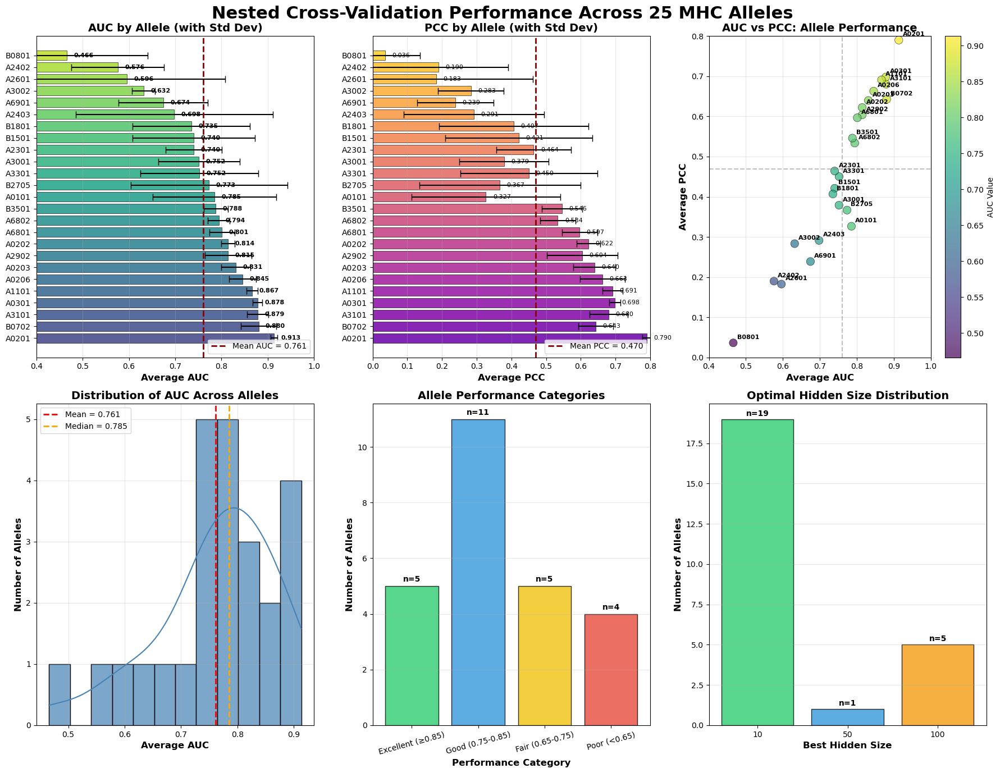


SUMMARY STATISTICS
Total alleles analyzed: 25
Average AUC: 0.7610 +/- 0.1074
Average PCC: 0.4699 +/- 0.1964
Best performing allele: A0201 (AUC: 0.9133)
Worst performing allele: B0801 (AUC: 0.4659)

Category breakdown:
  Excellent (≥0.85): 5 alleles (20.0%)
  Good (0.75-0.85): 11 alleles (44.0%)
  Fair (0.65-0.75): 5 alleles (20.0%)
  Poor (<0.65): 4 alleles (16.0%)

TOP 5 BEST PERFORMING ALLELES
allele  avg_auc  avg_pcc
 A0201 0.913301 0.790186
 B0702 0.880396 0.642894
 A3101 0.878998 0.680279
 A0301 0.878110 0.698139
 A1101 0.866593 0.691188

TOP 5 WORST PERFORMING ALLELES
allele  avg_auc  avg_pcc
 A6901 0.674433 0.238797
 A3002 0.631768 0.283334
 A2601 0.596016 0.182634
 A2402 0.575870 0.190090
 B0801 0.465867 0.036369

Full results saved to results/nested_cv/all_25_alleles_summary.csv


In [20]:
# All 25 Alleles Results

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# Load the results
try:
    # Try to load from the saved CSV
    results_df = pd.read_csv("results/nested_cv/all_alleles_final_25.csv")
    print(f"Loaded {len(results_df)} alleles from CSV")
except:
    # If not saved yet, use the variable
    if all_allele_results:
        results_df = pd.DataFrame(all_allele_results)
        print(f"Loaded {len(results_df)} alleles from memory")
    else:
        print("No results found!")
        results_df = None

if results_df is not None and len(results_df) > 0:
    # Sort by AUC for better visualization
    results_df = results_df.sort_values('avg_auc', ascending=False).reset_index(drop=True)
    
    # Create figure with subplots
    fig = plt.figure(figsize=(18, 14))
    fig.suptitle('Nested Cross-Validation Performance Across 25 MHC Alleles', 
                 fontsize=22, fontweight='bold', y=0.98)
    
    # --- Plot 1: AUC with error bars (horizontal bar chart) ---
    ax1 = plt.subplot(2, 3, 1)
    colors = plt.cm.viridis(np.linspace(0.2, 0.9, len(results_df)))
    bars1 = ax1.barh(results_df['allele'], results_df['avg_auc'], 
                     xerr=results_df['std_auc'], color=colors,
                     capsize=4, edgecolor='black', linewidth=0.5, alpha=0.85)
    
    # Add value labels
    for i, (bar, val) in enumerate(zip(bars1, results_df['avg_auc'])):
        ax1.text(val + 0.015, bar.get_y() + bar.get_height()/2, 
                 f'{val:.3f}', va='center', fontsize=8, fontweight='bold')
    
    # Add mean line
    mean_auc = results_df['avg_auc'].mean()
    ax1.axvline(x=mean_auc, color='darkred', linestyle='--', 
                linewidth=2, label=f'Mean AUC = {mean_auc:.3f}')
    ax1.set_xlabel('Average AUC', fontsize=12, fontweight='bold')
    ax1.set_title('AUC by Allele (with Std Dev)', fontsize=14, fontweight='bold')
    ax1.set_xlim(0.4, 1.0)
    ax1.legend(loc='lower right', fontsize=10)
    ax1.grid(axis='x', alpha=0.3)
    
    # --- Plot 2: PCC with error bars ---
    ax2 = plt.subplot(2, 3, 2)
    colors2 = plt.cm.plasma(np.linspace(0.2, 0.9, len(results_df)))
    bars2 = ax2.barh(results_df['allele'], results_df['avg_pcc'], 
                     xerr=results_df['std_pcc'], color=colors2,
                     capsize=4, edgecolor='black', linewidth=0.5, alpha=0.85)
    
    for i, (bar, val) in enumerate(zip(bars2, results_df['avg_pcc'])):
        ax2.text(val + 0.02, bar.get_y() + bar.get_height()/2, 
                 f'{val:.3f}', va='center', fontsize=8)
    
    mean_pcc = results_df['avg_pcc'].mean()
    ax2.axvline(x=mean_pcc, color='darkred', linestyle='--', 
                linewidth=2, label=f'Mean PCC = {mean_pcc:.3f}')
    ax2.set_xlabel('Average PCC', fontsize=12, fontweight='bold')
    ax2.set_title('PCC by Allele (with Std Dev)', fontsize=14, fontweight='bold')
    ax2.set_xlim(0, 0.8)
    ax2.legend(loc='lower right', fontsize=10)
    ax2.grid(axis='x', alpha=0.3)
    
    # --- Plot 3: AUC vs PCC Scatter ---
    ax3 = plt.subplot(2, 3, 3)
    scatter = ax3.scatter(results_df['avg_auc'], results_df['avg_pcc'],
                         s=results_df['n_folds'] * 15 + 30,
                         c=results_df['avg_auc'], cmap='viridis',
                         alpha=0.7, edgecolors='black', linewidth=0.5)
    
    # Add allele labels
    for _, row in results_df.iterrows():
        ax3.annotate(row['allele'], (row['avg_auc'], row['avg_pcc']),
                     fontsize=8, xytext=(5, 5), textcoords='offset points',
                     fontweight='bold')
    
    ax3.axhline(y=mean_pcc, color='gray', linestyle='--', alpha=0.5)
    ax3.axvline(x=mean_auc, color='gray', linestyle='--', alpha=0.5)
    ax3.set_xlabel('Average AUC', fontsize=12, fontweight='bold')
    ax3.set_ylabel('Average PCC', fontsize=12, fontweight='bold')
    ax3.set_title('AUC vs PCC: Allele Performance', fontsize=14, fontweight='bold')
    ax3.set_xlim(0.4, 1.0)
    ax3.set_ylim(0, 0.8)
    ax3.grid(alpha=0.3)
    cbar = plt.colorbar(scatter, ax=ax3)
    cbar.set_label('AUC Value', fontsize=10)
    
    # --- Plot 4: Distribution of AUCs (Histogram + KDE) ---
    ax4 = plt.subplot(2, 3, 4)
    sns.histplot(results_df['avg_auc'], kde=True, color='steelblue', 
                 bins=12, ax=ax4, edgecolor='black', alpha=0.7)
    ax4.axvline(x=mean_auc, color='red', linestyle='--', 
                linewidth=2, label=f'Mean = {mean_auc:.3f}')
    ax4.axvline(x=results_df['avg_auc'].median(), color='orange', linestyle='--', 
                linewidth=2, label=f'Median = {results_df["avg_auc"].median():.3f}')
    ax4.set_xlabel('Average AUC', fontsize=12, fontweight='bold')
    ax4.set_ylabel('Number of Alleles', fontsize=12, fontweight='bold')
    ax4.set_title('Distribution of AUC Across Alleles', fontsize=14, fontweight='bold')
    ax4.legend(fontsize=10)
    ax4.grid(alpha=0.3)
    
    # --- Plot 5: Performance Categories (Pie Chart) ---
    ax5 = plt.subplot(2, 3, 5)
    
    def categorize_auc(auc):
        if auc >= 0.85: return 'Excellent (≥0.85)'
        elif auc >= 0.75: return 'Good (0.75-0.85)'
        elif auc >= 0.65: return 'Fair (0.65-0.75)'
        else: return 'Poor (<0.65)'
    
    results_df['category'] = results_df['avg_auc'].apply(categorize_auc)
    category_order = ['Excellent (≥0.85)', 'Good (0.75-0.85)', 
                      'Fair (0.65-0.75)', 'Poor (<0.65)']
    category_counts = results_df['category'].value_counts().reindex(category_order).fillna(0)
    colors_cat = ['#2ecc71', '#3498db', '#f1c40f', '#e74c3c']
    
    # Bar chart for categories
    bars5 = ax5.bar(category_counts.index, category_counts.values, 
                    color=colors_cat, edgecolor='black', linewidth=1, alpha=0.8)
    for bar, count in zip(bars5, category_counts.values):
        ax5.text(bar.get_x() + bar.get_width()/2, count + 0.1, 
                 f'n={int(count)}', ha='center', va='bottom', 
                 fontsize=10, fontweight='bold')
    ax5.set_xlabel('Performance Category', fontsize=12, fontweight='bold')
    ax5.set_ylabel('Number of Alleles', fontsize=12, fontweight='bold')
    ax5.set_title('Allele Performance Categories', fontsize=14, fontweight='bold')
    ax5.tick_params(axis='x', rotation=15)
    ax5.grid(axis='y', alpha=0.3)
    
    # --- Plot 6: Hidden Size vs AUC ---
    ax6 = plt.subplot(2, 3, 6)
    
    # Extract hidden size choices
    hidden_size_dist = results_df['best_hidden_most_common'].value_counts().sort_index()
    bars6 = ax6.bar(hidden_size_dist.index.astype(str), hidden_size_dist.values,
                    color=['#2ecc71', '#3498db', '#f39c12', '#e74c3c'],
                    edgecolor='black', linewidth=1, alpha=0.8)
    for bar, count in zip(bars6, hidden_size_dist.values):
        ax6.text(bar.get_x() + bar.get_width()/2, count + 0.1, 
                 f'n={count}', ha='center', va='bottom', fontsize=10, fontweight='bold')
    ax6.set_xlabel('Best Hidden Size', fontsize=12, fontweight='bold')
    ax6.set_ylabel('Number of Alleles', fontsize=12, fontweight='bold')
    ax6.set_title('Optimal Hidden Size Distribution', fontsize=14, fontweight='bold')
    ax6.grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('results/nested_cv/all_25_alleles_dashboard.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # --- Print Summary Statistics ---
    print("\n" + "=" * 70)
    print("SUMMARY STATISTICS")
    print("=" * 70)
    print(f"Total alleles analyzed: {len(results_df)}")
    print(f"Average AUC: {mean_auc:.4f} +/- {results_df['avg_auc'].std():.4f}")
    print(f"Average PCC: {mean_pcc:.4f} +/- {results_df['avg_pcc'].std():.4f}")
    print(f"Best performing allele: {results_df.iloc[0]['allele']} (AUC: {results_df.iloc[0]['avg_auc']:.4f})")
    print(f"Worst performing allele: {results_df.iloc[-1]['allele']} (AUC: {results_df.iloc[-1]['avg_auc']:.4f})")
    print(f"\nCategory breakdown:")
    for cat in category_order:
        count = category_counts.get(cat, 0)
        print(f"  {cat}: {int(count)} alleles ({count/len(results_df)*100:.1f}%)")
    
    # --- Best and Worst Alleles Table ---
    print("\n" + "=" * 70)
    print("TOP 5 BEST PERFORMING ALLELES")
    print("=" * 70)
    print(results_df[['allele', 'avg_auc', 'avg_pcc']].head(5).to_string(index=False))
    
    print("\n" + "=" * 70)
    print("TOP 5 WORST PERFORMING ALLELES")
    print("=" * 70)
    print(results_df[['allele', 'avg_auc', 'avg_pcc']].tail(5).to_string(index=False))
    
    # Save summary table
    results_df.to_csv("results/nested_cv/all_25_alleles_summary.csv", index=False)
    print("\nFull results saved to results/nested_cv/all_25_alleles_summary.csv")
    
else:
    print("No results to visualize. Run the all-alleles test first!")

Target stats: min=0.0000, max=1.0000
Mean: 0.1495, Median: 0.0847


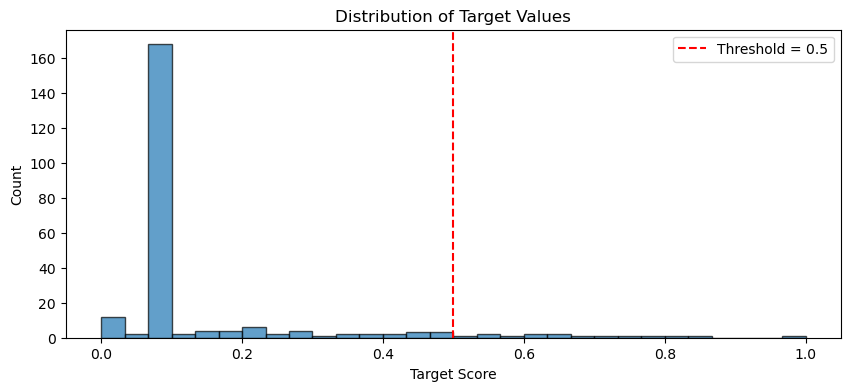

In [21]:
# Check distribution of target values
import matplotlib.pyplot as plt

# Load one file to see the distribution
sample_file = "Data/Alleles/A0101/c000"
df = pd.read_csv(sample_file, sep=r"\s+", usecols=[0, 1], names=["peptide", "target"])

print(f"Target stats: min={df['target'].min():.4f}, max={df['target'].max():.4f}")
print(f"Mean: {df['target'].mean():.4f}, Median: {df['target'].median():.4f}")

# Plot distribution
plt.figure(figsize=(10, 4))
plt.hist(df['target'], bins=30, edgecolor='black', alpha=0.7)
plt.axvline(x=0.5, color='red', linestyle='--', label='Threshold = 0.5')
plt.xlabel('Target Score')
plt.ylabel('Count')
plt.title('Distribution of Target Values')
plt.legend()
plt.show()